In [72]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn import linear_model

import numpy as np
import statsmodels.api as sm

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, precision_score, r2_score, mean_absolute_error, mean_squared_error

## Importando os dados para análise

In [28]:
df1 = pd.read_csv("../Dados/fifa_players.csv")
pd.set_option('display.max_columns', None)
# A coluna "ID" não interessa para a análise
df1.drop(df1.columns[0],axis=1,inplace=True)
# Transformando "Rigth" e "Left" em dummies
df1['Preferred_Foot'] = pd.get_dummies(df1.Preferred_Foot)
# Para o ajuste do modelo interessa apenas as features numéricas
df1 = df1.select_dtypes(include=np.number)
# Preenchendo os campos vazios com zeros
df1 = df1.fillna(0)
df1.head(5)

,Age,Overall,Potential,Value,Wage,Special,Preferred_Foot,International_Reputation,Weak_Foot,Skill_Moves,Jersey_Number,Contract_Valid_Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release_Clause
0,31,94,94,110500000.0,565000.0,2202,1,5.0,4.0,4.0,10.0,2021,1.70,72.0,88,88,88,92,93,93,93,92,93,93,93,91,84,84,84,91,64,61,61,61,64,59,47,47,47,59,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,226500000.0
1,33,94,94,77000000.0,405000.0,2228,0,5.0,4.0,5.0,7.0,2022,1.88,83.0,91,91,91,89,90,90,90,89,88,88,88,88,81,81,81,88,65,61,61,61,65,61,53,53,53,61,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,127100000.0
2,26,92,93,118500000.0,290000.0,2143,0,5.0,5.0,5.0,10.0,2022,1.75,68.0,84,84,84,89,89,89,89,89,89,89,89,88,81,81,81,88,65,60,60,60,65,60,47,47,47,60,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,228100000.0
3,27,91,92,102000000.0,355000.0,2281,0,4.0,5.0,4.0,7.0,2023,1.80,70.0,82,82,82,87,87,87,87,87,88,88,88,88,87,87,87,88,77,77,77,77,77,73,66,66,66,73,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,196400000.0
4,27,91,91,93000000.0,340000.0,2142,0,4.0,4.0,4.0,10.0,2020,1.73,74.0,83,83,83,89,88,88,88,89,89,89,89,89,82,82,82,89,66,63,63,63,66,60,49,49,49,60,81.0,84.0,61.0,89.0,80.0,95.0,83.0,79.0,83.0,94.0,94.0,88.0,95.0,90.0,94.0,82.0,56.0,83.0,66.0,80.0,54.0,41.0,87.0,89.0,86.0,91.0,34.0,27.0,22.0,11.0,12.0,6.0,8.0,8.0,172100000.0


In [4]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14743 entries, 0 to 14742
Data columns (total 75 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Age                       14743 non-null  int64  
 1   Overall                   14743 non-null  int64  
 2   Potential                 14743 non-null  int64  
 3   Value                     14743 non-null  float64
 4   Wage                      14743 non-null  float64
 5   Special                   14743 non-null  int64  
 6   Preferred_Foot            14743 non-null  uint8  
 7   International_Reputation  14743 non-null  float64
 8   Weak_Foot                 14743 non-null  float64
 9   Skill_Moves               14743 non-null  float64
 10  Jersey_Number             14743 non-null  float64
 11  Contract_Valid_Until      14743 non-null  int64  
 12  Height                    14743 non-null  float64
 13  Weight                    14743 non-null  float64
 14  LS    

### Análise preliminar dos dados tratados

In [138]:
df1.describe()

,Age,Overall,Potential,Value,Wage,Special,Preferred_Foot,International_Reputation,Weak_Foot,Skill_Moves,Jersey_Number,Contract_Valid_Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release_Clause
count,14743.000000,14743.000000,14743.000000,1.474300e+04,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.00000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.000000,14743.00000,14743.000000,14743.000000,14743.000000,1.474300e+04
mean,25.114088,66.381808,71.334871,2.551617e+06,9990.639626,1666.474259,0.246015,1.117073,3.001221,2.523435,19.522553,2020.256529,1.803268,74.436478,57.690769,57.690769,57.690769,58.920030,58.594587,58.594587,58.594587,58.920030,58.872821,58.872821,58.872821,59.639693,58.170115,58.170115,58.170115,59.639693,57.550024,56.884623,56.884623,56.884623,57.550024,56.863325,55.710303,55.710303,55.710303,56.863325,54.150783,49.554840,56.98908,62.580140,46.590518,60.425965,51.171471,46.405752,56.098962,63.062335,67.835380,67.896832,66.365258,62.165638,66.602862,59.475141,66.085193,67.387031,65.924981,51.255715,59.731601,50.634674,54.672997,55.395985,51.998101,60.304823,51.464763,52.115105,49.838160,10.503764,10.55952,10.560537,10.528793,10.506817,4.789646e+06
std,4.594359,6.889961,6.099177,5.833752e+06,22834.380828,198.177615,0.430702,0.400780,0.635514,0.616425,15.701907,1.290832,0.064284,6.703886,9.130883,9.130883,9.130883,9.889666,9.849353,9.849353,9.849353,9.889666,9.784514,9.784514,9.784514,9.275242,8.845634,8.845634,8.845634,9.275242,8.999227,10.102019,10.102019,10.102019,8.999227,9.543208,11.706942,11.706942,11.706942,9.543208,14.163962,16.344687,11.61646,9.845651,14.792342,12.547495,15.171919,15.103861,12.400078,10.045939,11.780846,11.512529,12.353436,8.865933,12.160377,13.261653,11.543718,11.266826,12.572630,15.763188,14.411320,18.752402,14.700189,12.934748,12.528973,10.232503,17.167619,19.085715,19.081212,3.099594,3.08087,3.144226,3.075250,3.103504,1.133151e+07
min,16.000000,46.000000,48.000000,1.000000e+04,1000.000000,1000.000000,0.000000,1.000000,1.000000,2.000000,2.000000,2018.000000,1.550000,50.000000,31.000000,31.000000,31.000000,25.000000,27.000000,27.000000,27.000000,25.000000,27.000000,27.000000,27.000000,27.000000,30.000000,30.000000,30.000000,27.000000,30.000000,28.000000,28.000000,28.000000,30.000000,29.000000,25.000000,25.000000,25.000000,29.000000,11.000000,10.000000,15.00000,20.000000,10.000000,14.000000,11.000000,10.000000,19.000000,25.000000,20.000000,26.000000,23.000000,21.000000,22.000000,14.000000,28.000000,27.000000,25.000000,11.000000,13.000000,10.000000,11.000000,12.000000,12.000000,29.000000,10.000000,10.000000,10.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.300000e+04
25%,21.000000,62.000000,67.000000,3.500000e+05,1000.000000,1524.000000,0.000000,1.000000,3.000000,2.000000,8.000000,2019.000000,1.750000,70.000000,51.000000,51.000000

## Vizualizando algumas relações lineares

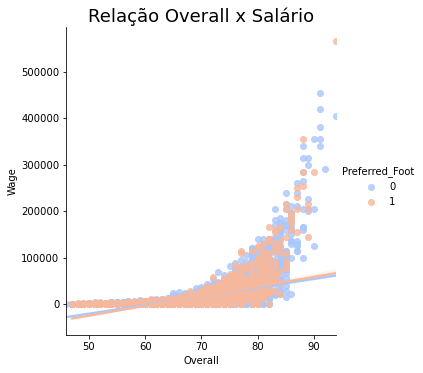

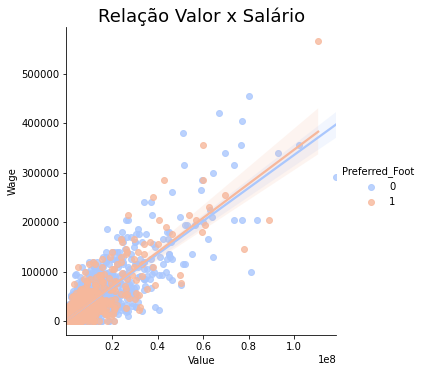

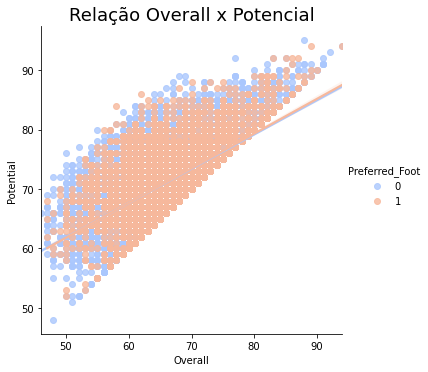

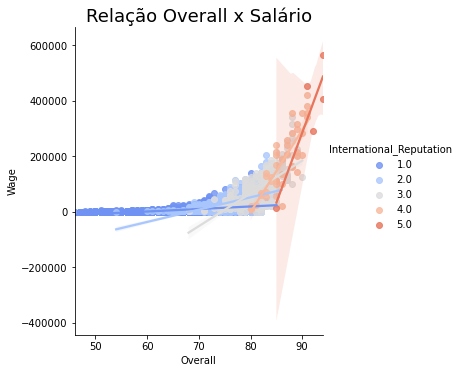

In [13]:
sns.lmplot(x='Overall', y= 'Wage', data = df1, hue ='Preferred_Foot', 
           palette='coolwarm', height=5)
plt.title('Relação Overall x Salário', size=18);

sns.lmplot(x='Value', y= 'Wage', data = df1, hue ='Preferred_Foot', 
           palette='coolwarm', height=5)
plt.title('Relação Valor x Salário', size=18);

sns.lmplot(x='Overall', y= 'Potential', data = df1, hue ='Preferred_Foot', 
           palette='coolwarm', height=5)
plt.title('Relação Overall x Potencial', size=18);

sns.lmplot(x='Overall', y= 'Wage', data = df1, hue ='International_Reputation', 
           palette='coolwarm', height=5)
plt.title('Relação Overall x Salário', size=18);

# Regressão Linear

Utilizamos `Regressão Linear multivariada` pois queremos fazer previsões baseadas em várias features. Isso porque a `Regressão Logística` não é um modelo que atende de maneira precisa o suficiente o pretendido, dado que o conjunto de dados é contínuo e o objetivo não é classifica-los, mas sim prever um valor.

## Variável OVERALL

### Ajustando o modelo para análise preliminar

In [119]:
reg = linear_model.LinearRegression()
feature = "Overall"
X = df1.drop(feature, axis = 1)
y = df1[f"{feature}"]
reg.fit(X, y);

In [120]:
reg.score(X, y)

0.9365948365973505

### Analisando a importância das features

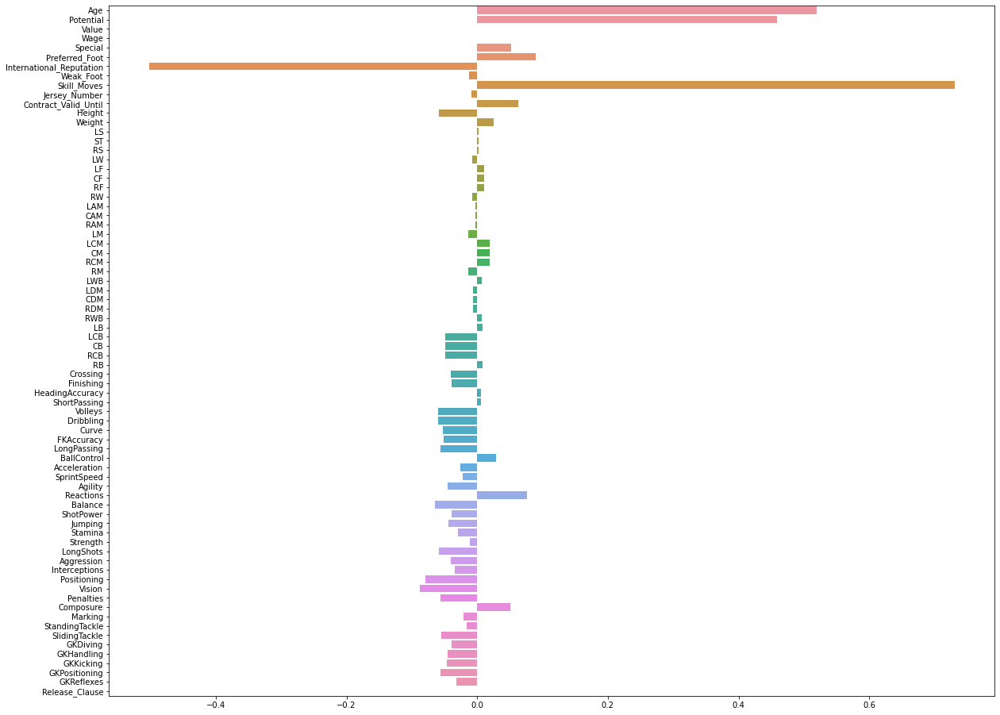

In [121]:
plt.figure(figsize=(20,16))
sns.barplot(y=X.columns, x=reg.coef_);

## Modelo definitivo

Baseado nisso montaremos outro modelo selecionando apenas as features mais relevantes para prever o Overall.

### Selecionando as features para o novo modelo

In [122]:
X_imp = df1[["Age", "Potential", "Special", "Preferred_Foot", "International_Reputation", "Skill_Moves", "Reactions"]]
y = df1.Overall

## Separando em dados de treino e teste

In [123]:
X_train, X_test, y_train, y_test = train_test_split(X_imp,y, test_size=0.4, random_state = 123)

## Ajustando o modelo

In [124]:
reg_imp = linear_model.LinearRegression()
reg_imp.fit(X_train, y_train);

## Fazendo as previsões

In [125]:
# Criando o conjunto de dados previstos
pred = reg_imp.predict(X_test)


# Utilizando uma entrada do próprio dataframe para mostrar uma previsão
entrada = 5245
print("Predito: ", round(reg_imp.predict([X_test.iloc[entrada]])[0], 0), "\nReal: ", df1.Overall[entrada])

Predito:  68.0 
Real:  69


## Analisando as métricas da regressão

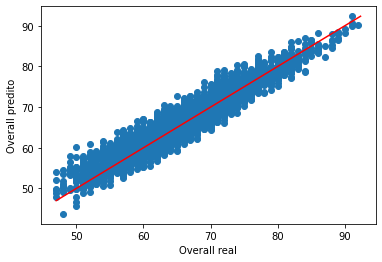

In [126]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.scatter(y_test, pred)
range = [y_test.min(), pred.max()]
plt.plot(range, range, 'red')
plt.xlabel('Overall real')
plt.ylabel('Overall predito')
plt.show()

## Sobre as métricas

- Coeficientes: São os pesos das features do modelo.
- Intercept: O termo independente da regressão.
- R_2: Quanto mais próximo de 0, menos o modelo é preciso sobre a variabilidade dos dados, e quanto mais próximo de 1 melhor explica a variação entre as variáveis.
- Erro Médio Absoluto: É a soma das distâncias dos pontos à reta(erros) dividido pela quantidade de pontos.
- Erro Quadrático Médio: É o quadrado da soma das distâncias dos pontos à reta(erros) dividido pela quantidade de pontos.

In [127]:
print("Métricas\n",
"\n#####################"
"\nCoeficientes: ", reg_imp.coef_,
"\n\nIntercept: ", reg_imp.intercept_,
"\n\nR Quadrado: ", r2_score(y_test, pred),
"\n\nErro médio absoluto: ", mean_absolute_error(y_test, pred),
"\n\nErro quadrático médio: ", mean_squared_error(y_test, pred),
"\n#####################")

Métricas
 
#####################
Coeficientes:  [ 0.63478386  0.61992451  0.00602969 -0.02383449  0.11582949  0.30604093
  0.17823478] 

Intercept:  -15.809104710519506 

R Quadrado:  0.9030553914631129 

Erro médio absoluto:  1.6749131211270774 

Erro quadrático médio:  4.576925644735598 
#####################


## Relação das habilidades com o OVERALL

### O processo é o mesmo de ajuste, criação do conjunto de teste e treino, previsão dos resultados e validação.

In [128]:
X_hab = df1.iloc[:, 40:73]
y = df1.Overall

In [129]:
X_hab_train, X_hab_test, y_hab_train, y_hab_test = train_test_split(X_hab,y, test_size=0.4, random_state = 123)

In [130]:
reg_hab = linear_model.LinearRegression()
reg_hab.fit(X_hab_train, y_hab_train);

In [134]:
# Criando o conjunto de dados previstos
pred_hab = reg_hab.predict(X_hab_test)


# Utilizando uma entrada do próprio dataframe para mostrar uma previsão
entrada = 5245
print("Predito: ", round(reg_hab.predict([X_hab.iloc[entrada]])[0], 0), "\nReal: ", df1.Overall[entrada])

Predito:  68.0 
Real:  69


In [132]:
print("Métricas\n",
"\n#####################"
"\nCoeficientes: ", reg_hab.coef_,
"\n\nIntercept: ", reg_hab.intercept_,
"\n\nR Quadrado: ", r2_score(y_hab_test, pred_hab),
"\n\nErro médio absoluto: ", mean_absolute_error(y_hab_test, pred_hab),
"\n\nErro quadrático médio: ", mean_squared_error(y_hab_test, pred_hab),
"\n#####################")

Métricas
 
#####################
Coeficientes:  [ 1.66681436e-02  3.47626574e-02  8.90619872e-02  9.80187531e-02
 -8.86036128e-03 -2.93921977e-03  4.89519067e-03  1.06892920e-02
 -1.03611657e-02  1.65545255e-01  4.83562309e-02  3.15321808e-02
 -2.14584160e-04  2.73364146e-01 -1.19262548e-02  2.06078652e-02
  3.68361071e-04  6.59180913e-03  4.89456683e-02 -1.73877080e-02
  1.23417755e-03 -3.26033312e-03 -5.09188088e-02 -3.96748504e-02
  5.62803363e-03  1.44721882e-01  3.17776630e-02  2.79362620e-02
 -2.21444244e-02  8.08424145e-03  4.12218585e-03 -3.75236042e-03
 -5.53125899e-03] 

Intercept:  10.946038813640413 

R Quadrado:  0.8695548228648098 

Erro médio absoluto:  1.9480302419737494 

Erro quadrático médio:  6.15854646764558 
#####################


Concluimos que o modelo não se alterou para se obter a previsão do OVERALL, ainda que tenhamos pego partes separadas do dataset para fazer os conjuntos de teste e treino. E que as métricas apresentadas indicam que o modelo é preciso para o que se propõe, ou seja, a previsão do OVERALL dado um conjunto reduzido dos dados retorna valores coerentes e precisos.